In [1]:
import tensorflow as tf
from tensorflow.keras import models, layers
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as colors
from astropy import stats
from skimage.transform import resize
from scipy.ndimage import rotate # could use skimage rotate
import sys
import time
from IPython import display
from astropy.io import fits 
from scipy.ndimage import rotate
import glob
from tqdm import tqdm
import random
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
import seaborn as sn
import pandas as pd

In [2]:
def augment(files, m):

    array = np.empty([len(files)*m*2, 128, 128])
    rotation = np.linspace(0, 360, m, endpoint=False)
    
    sigma = 1
    
    it = 0
    i = 0
    pbar = tqdm(total=len(array))
    while i < len(files):
        image = fits.open(files[i])[0].data.squeeze()
        
        mean, median, std = stats.sigma_clipped_stats(image, sigma=sigma)
        image[image < median+sigma*std] = median+sigma*std
        image = 2*((image-np.min(image))/np.ptp(image))-1
        image = np.where(np.isnan(image), 0, image)
        mean_n, median_n, std_n = stats.sigma_clipped_stats(image, sigma=sigma)
        
        j = 0
        while j < m:        
            image_rot1 = rotate(image, rotation[j], reshape=False, cval = median_n)
            image_rot1[image_rot1 > 1] = 1
            image_rot1[image_rot1 < -1] = -1
            image_rot2 = np.fliplr(image_rot1)
            array[it] = image_rot1
            array[it+1] = image_rot2                    
            pbar.update(2)
            it+=2
            j+=1
        i+=1
        
    return array

In [3]:
def show_images(images, labels, predictions, num, predict):
    cols = 6
    rows = (num+cols-1)//cols
    plt.figure(figsize=(cols*4, rows*4))
    for i in range(num):
        ax = plt.subplot(rows, cols, i+1)
        image = images[i]
        if predict:
                plt.title('{} // {}'.format(predictions[i], labels[i]))
        else:
            plt.title(labels[i])
        plt.imshow(image, cmap='inferno')
        plt.axis('off')
    plt.show() 

In [4]:
files1 = glob.glob(r'Filaments\cut*')
files2 = glob.glob(r'Not Filaments\cut*')[:5000]

In [5]:
print(len(files1))
print(len(files2))

93
5000


In [6]:
fil = augment(files1, int(len(files2)/len(files1)))
n_fil = augment(files2, 1)

  0%|                                                                                        | 0/10000 [00:00<?, ?it/s]<ipython-input-2-c69896b8941a>:16: RuntimeWarning: invalid value encountered in true_divide
  image = 2*((image-np.min(image))/np.ptp(image))-1
<ipython-input-2-c69896b8941a>:16: RuntimeWarning: invalid value encountered in true_divide
  image = 2*((image-np.min(image))/np.ptp(image))-1
100%|█████████████████████████████████████████████████████████████████████████████| 9858/9858 [00:11<00:00, 886.53it/s]

 15%|███████████▏                                                                | 1468/10000 [00:07<00:44, 190.57it/s]<ipython-input-2-c69896b8941a>:16: RuntimeWarning: invalid value encountered in true_divide
  image = 2*((image-np.min(image))/np.ptp(image))-1

 15%|███████████▎                                                                | 1488/10000 [00:07<00:44, 191.64it/s]<ipython-input-2-c69896b8941a>:16: RuntimeWarning: invalid value encountered in true_divi

 32%|████████████████████████▍                                                   | 3214/10000 [00:16<00:35, 193.46it/s]<ipython-input-2-c69896b8941a>:16: RuntimeWarning: invalid value encountered in true_divide
  image = 2*((image-np.min(image))/np.ptp(image))-1

 32%|████████████████████████▌                                                   | 3234/10000 [00:16<00:34, 193.67it/s]<ipython-input-2-c69896b8941a>:16: RuntimeWarning: invalid value encountered in true_divide
  image = 2*((image-np.min(image))/np.ptp(image))-1

 33%|████████████████████████▋                                                   | 3254/10000 [00:17<00:34, 194.95it/s]<ipython-input-2-c69896b8941a>:16: RuntimeWarning: invalid value encountered in true_divide
  image = 2*((image-np.min(image))/np.ptp(image))-1

 33%|████████████████████████▉                                                   | 3274/10000 [00:17<00:34, 194.72it/s]<ipython-input-2-c69896b8941a>:16: RuntimeWarning: invalid value encountered in true_divi

 49%|█████████████████████████████████████▏                                      | 4898/10000 [00:25<00:27, 182.82it/s]<ipython-input-2-c69896b8941a>:16: RuntimeWarning: invalid value encountered in true_divide
  image = 2*((image-np.min(image))/np.ptp(image))-1

 49%|█████████████████████████████████████▍                                      | 4918/10000 [00:26<00:27, 185.65it/s]<ipython-input-2-c69896b8941a>:16: RuntimeWarning: invalid value encountered in true_divide
  image = 2*((image-np.min(image))/np.ptp(image))-1

 60%|█████████████████████████████████████████████▍                              | 5972/10000 [00:31<00:22, 182.90it/s]<ipython-input-2-c69896b8941a>:16: RuntimeWarning: invalid value encountered in true_divide
  image = 2*((image-np.min(image))/np.ptp(image))-1

 66%|██████████████████████████████████████████████████▎                         | 6626/10000 [00:35<00:17, 192.61it/s]<ipython-input-2-c69896b8941a>:16: RuntimeWarning: invalid value encountered in true_divi

 74%|███████████████████████████████████████████████████████▉                    | 7366/10000 [00:39<00:13, 190.48it/s]<ipython-input-2-c69896b8941a>:16: RuntimeWarning: invalid value encountered in true_divide
  image = 2*((image-np.min(image))/np.ptp(image))-1

 75%|█████████████████████████████████████████████████████████▎                  | 7546/10000 [00:40<00:13, 186.27it/s]<ipython-input-2-c69896b8941a>:16: RuntimeWarning: invalid value encountered in true_divide
  image = 2*((image-np.min(image))/np.ptp(image))-1

 76%|█████████████████████████████████████████████████████████▌                  | 7566/10000 [00:40<00:13, 185.29it/s]<ipython-input-2-c69896b8941a>:16: RuntimeWarning: invalid value encountered in true_divide
  image = 2*((image-np.min(image))/np.ptp(image))-1

 77%|██████████████████████████████████████████████████████████▉                 | 7748/10000 [00:41<00:12, 186.22it/s]<ipython-input-2-c69896b8941a>:16: RuntimeWarning: invalid value encountered in true_divi


 85%|████████████████████████████████████████████████████████████████▍           | 8476/10000 [00:45<00:08, 186.29it/s]<ipython-input-2-c69896b8941a>:16: RuntimeWarning: invalid value encountered in true_divide
  image = 2*((image-np.min(image))/np.ptp(image))-1
<ipython-input-2-c69896b8941a>:16: RuntimeWarning: invalid value encountered in true_divide
  image = 2*((image-np.min(image))/np.ptp(image))-1
<ipython-input-2-c69896b8941a>:16: RuntimeWarning: invalid value encountered in true_divide
  image = 2*((image-np.min(image))/np.ptp(image))-1
<ipython-input-2-c69896b8941a>:16: RuntimeWarning: invalid value encountered in true_divide
  image = 2*((image-np.min(image))/np.ptp(image))-1
<ipython-input-2-c69896b8941a>:16: RuntimeWarning: invalid value encountered in true_divide
  image = 2*((image-np.min(image))/np.ptp(image))-1
<ipython-input-2-c69896b8941a>:16: RuntimeWarning: invalid value encountered in true_divide
  image = 2*((image-np.min(image))/np.ptp(image))-1

 85%|██████████

<ipython-input-2-c69896b8941a>:16: RuntimeWarning: invalid value encountered in true_divide
  image = 2*((image-np.min(image))/np.ptp(image))-1

 92%|█████████████████████████████████████████████████████████████████████▉      | 9208/10000 [00:49<00:04, 180.77it/s]<ipython-input-2-c69896b8941a>:16: RuntimeWarning: invalid value encountered in true_divide
  image = 2*((image-np.min(image))/np.ptp(image))-1
<ipython-input-2-c69896b8941a>:16: RuntimeWarning: invalid value encountered in true_divide
  image = 2*((image-np.min(image))/np.ptp(image))-1
<ipython-input-2-c69896b8941a>:16: RuntimeWarning: invalid value encountered in true_divide
  image = 2*((image-np.min(image))/np.ptp(image))-1
<ipython-input-2-c69896b8941a>:16: RuntimeWarning: invalid value encountered in true_divide
  image = 2*((image-np.min(image))/np.ptp(image))-1

 92%|██████████████████████████████████████████████████████████████████████▏     | 9228/10000 [00:49<00:04, 185.58it/s]<ipython-input-2-c69896b8941a>:16: Runti

<ipython-input-2-c69896b8941a>:16: RuntimeWarning: invalid value encountered in true_divide
  image = 2*((image-np.min(image))/np.ptp(image))-1
<ipython-input-2-c69896b8941a>:16: RuntimeWarning: invalid value encountered in true_divide
  image = 2*((image-np.min(image))/np.ptp(image))-1
<ipython-input-2-c69896b8941a>:16: RuntimeWarning: invalid value encountered in true_divide
  image = 2*((image-np.min(image))/np.ptp(image))-1

100%|███████████████████████████████████████████████████████████████████████████▉| 9986/10000 [00:53<00:00, 202.39it/s]

In [7]:
print(len(fil))
print(len(n_fil))
print(len(GAN))

9858
10000


In [8]:
labels_fil = np.full(len(fil), 1)
labels_nfil = np.zeros(len(n_fil))

In [9]:
images = np.concatenate((fil,n_fil))
labels = np.concatenate((labels_fil,labels_nfil))

In [10]:
print(np.max(images), np.min(images))

1.0 -1.0


In [11]:
a = list(zip(images, labels))
random.shuffle(a)
images, labels = zip(*a)

In [37]:
batch_size = 32
epochs = 100

train_images, test_images = train_test_split(images, test_size=0.2, shuffle=False)
train_labels, test_labels = train_test_split(labels, test_size=0.2, shuffle=False)

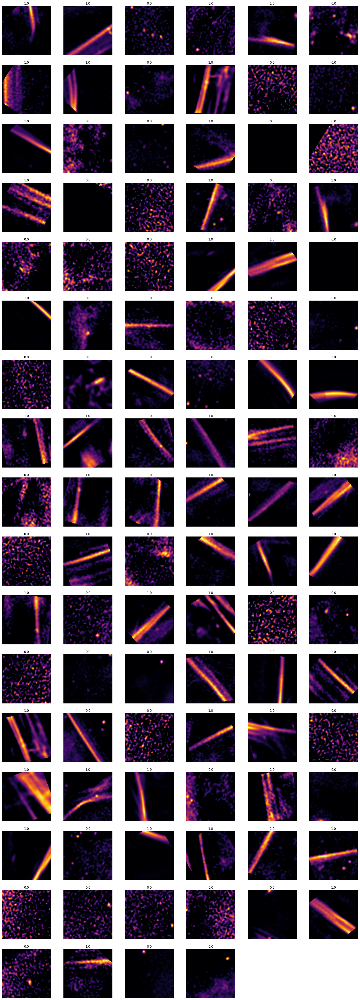

In [38]:
show_images(train_images, train_labels, _, 100, predict=False)

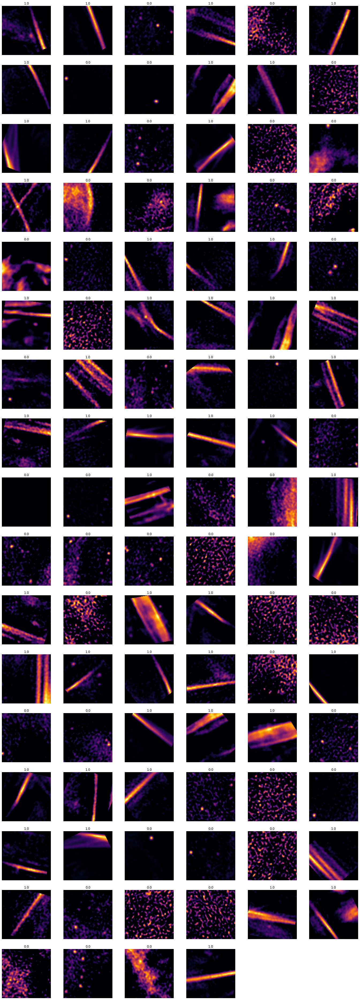

In [39]:
show_images(test_images, test_labels, _, 100, predict=False)

In [40]:
train_images = np.asarray(train_images)
test_images = np.asarray(test_images)

train_labels = np.asarray(train_labels)
test_labels = np.asarray(test_labels)

In [41]:
train_images = train_images[..., tf.newaxis].astype('float32')
test_images = test_images[..., tf.newaxis].astype('float32')

In [42]:
train_ds = tf.data.Dataset.from_tensor_slices((train_images, train_labels))
test_ds = tf.data.Dataset.from_tensor_slices((test_images, test_labels))

In [43]:
print('train images: ', train_images.shape)
print('test images: ', test_images.shape)

train images:  (15886, 128, 128, 1)
test images:  (3972, 128, 128, 1)


In [44]:
input_shape = train_images.shape[1:]

model = models.Sequential([
    layers.Conv2D(16, (3, 3), padding='same', activation='relu', input_shape=input_shape),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(32, (3, 3), padding='same', activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), padding='same', activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), padding='same', activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), padding='same', activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), padding='same', activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), padding='same', activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Flatten(),
    layers.Dense(512, activation='relu'),
    layers.Dropout(0.5),
    layers.Dense(1, activation='sigmoid')])


model.compile(optimizer="Adam", loss='binary_crossentropy', metrics=['accuracy'])

history = model.fit(train_ds.batch(batch_size), validation_data=test_ds.batch(batch_size), epochs=epochs)
model.evaluate(test_ds.batch(32), verbose=2)

Epoch 1/100
497/497 [==============================] - 10s 20ms/step - loss: 0.2353 - accuracy: 0.9056 - val_loss: 0.0595 - val_accuracy: 0.9766
Epoch 2/100
497/497 [==============================] - 10s 19ms/step - loss: 0.0468 - accuracy: 0.9861 - val_loss: 0.0467 - val_accuracy: 0.9849
Epoch 3/100
497/497 [==============================] - 10s 20ms/step - loss: 0.0305 - accuracy: 0.9918 - val_loss: 0.0178 - val_accuracy: 0.9947
Epoch 4/100
497/497 [==============================] - 10s 20ms/step - loss: 0.0268 - accuracy: 0.9925 - val_loss: 0.0269 - val_accuracy: 0.9917
Epoch 5/100
497/497 [==============================] - 10s 21ms/step - loss: 0.0237 - accuracy: 0.9931 - val_loss: 0.0209 - val_accuracy: 0.9942
Epoch 6/100
497/497 [==============================] - 10s 21ms/step - loss: 0.0199 - accuracy: 0.9943 - val_loss: 0.0184 - val_accuracy: 0.9935
Epoch 7/100
497/497 [==============================] - 10s 20ms/step - loss: 0.0156 - accuracy: 0.9953 - val_loss: 0.0137 - val_ac

[0.05813172459602356, 0.998237669467926]

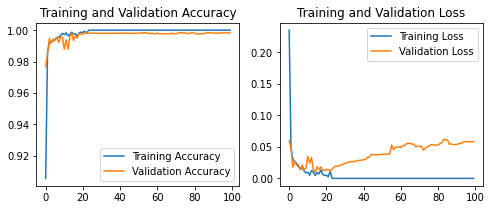

In [53]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']


epochs_range = range(epochs)
plt.figure(figsize=(8, 3))
plt.title("10000:0:0")
# plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

# plt.subplot(1, 2, 2)
# plt.plot(epochs_range, loss, label='Training Loss')
# plt.plot(epochs_range, val_loss, label='Validation Loss')
# plt.legend(loc='upper right')
# plt.title('Training and Validation Loss')
# plt.savefig("Real Filament CNN result")
# plt.show()



In [1]:
test_predictions = model.predict(test_images)
test_predictions = np.squeeze(test_predictions)

NameError: name 'model' is not defined

In [ ]:
a = confusion_matrix(test_labels, test_predictions.round())

In [ ]:
a = a/np.max(a)

In [ ]:
df_cm = pd.DataFrame(a, range(2), range(2))
plt.figure(figsize=(10,7))
plt.text(-0.3,1.3,'Predicted Class', fontsize=20, rotation=90)
plt.text(0.8,2.3,'True Class', fontsize=20)
sn.set(font_scale=1.4) # for label size
sn.heatmap(df_cm, annot=True, annot_kws={"size": 16}) # font size
plt.savefig('confushion_10000_0_0.png')
plt.show()

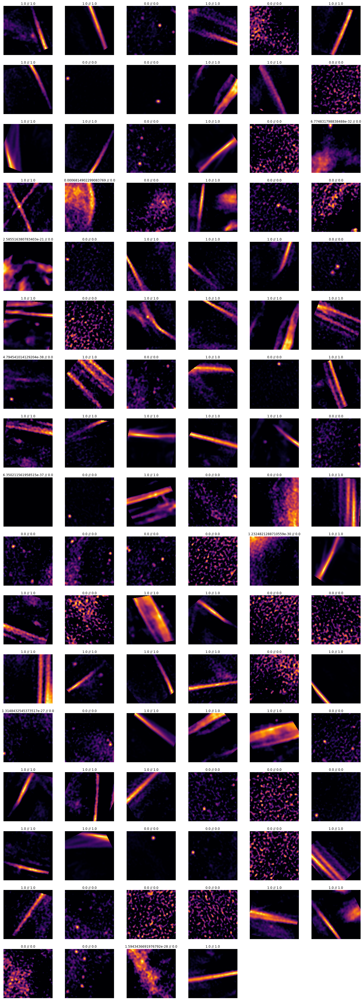

In [47]:
#some random examples
show_images(test_images, test_labels, test_predictions, 100, predict=True)

In [48]:
diff = abs(test_labels - test_predictions)

In [49]:
order = np.argsort(diff)

In [50]:
sorted_test_images = test_images[order][::-1]
sorted_test_labels = test_labels[order][::-1]
sorted_test_predictions = test_predictions[order][::-1]

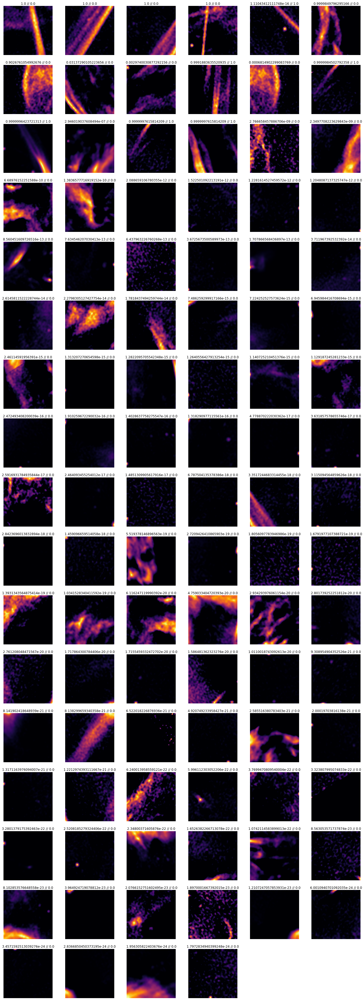

In [51]:
#the images it was least accurate for
show_images(sorted_test_images, sorted_test_labels, sorted_test_predictions, 100, predict=True)